In [1]:
from PIL import Image
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
import tensorflow as tf
import keras

In [4]:
print(tf.__version__, keras.__version__)

2.15.0 2.15.0


In [5]:
from osgeo import gdal

def create_tiles(input_file, output_dir, tile_size_x, tile_size_y, overlap=0):
    input_ds = gdal.Open(input_file)
    cols = input_ds.RasterXSize
    rows = input_ds.RasterYSize

    for i in range(0, cols, tile_size_x - overlap):
        for j in range(0, rows, tile_size_y - overlap):
            output_file = os.path.join(output_dir, f"tile_{i}_{j}.tif") #here
            gdal.Translate(output_file, input_ds, srcWin=[i, j, tile_size_x, tile_size_y])

    input_ds = None

def show_images(images, titles=None):
    if not titles:
        titles = [img.shape for img in images]
    fig, axes = plt.subplots(nrows=1, ncols=len(images), figsize=(10, 30))
    for i, ax in enumerate(axes):
        ax.imshow(images[i], cmap="summer")
        ax.set_title(titles[i])
        ax.axis("off")
    plt.show()

def show_1image(image, size = (10,10)):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=size)
    axes.imshow(image, cmap="summer")
    axes.axis("off")
    plt.show()

def del_dir_contents(dir_path):
  for file in os.listdir(dir_path):
    file_path = os.path.join(dir_path, file)
    os.remove(file_path)


# Directory Setup
Set paths according to where the files are located

In [6]:
# Input
dir_in = '/content/drive/MyDrive/SeniorProjectMockup/input'
file_name = 'village_test1.tif'

# Output
dir_tiles = '/content/tiles'
dir_masks = '/content/masks'

# Image dimensions
dim = 512

file_path = os.path.join(dir_in,file_name)

Delete contents of the Tile folder to have a fresh start

In [7]:
del_path = dir_tiles
try:
  del_dir_contents(del_path)
except:
  pass

Create tile folder and tiles from the input image (file_path)

In [8]:
try:
  os.mkdir(dir_tiles)
except:
  pass

create_tiles(file_path, dir_tiles, dim, dim, overlap=0)

Create Mask folder

In [9]:
try:
  os.mkdir(dir_masks)
except:
  pass

Delete contents of the Mask folder to have a fresh start

In [10]:
del_path = dir_masks
try:
  del_dir_contents(del_path)
except:
  pass

# Model Setup

In [11]:
!pip install -U -q segmentation-models
os.environ["SM_FRAMEWORK"] = "tf.keras"
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [12]:
backbone = 'inceptionresnetv2'
# backbone = 'inceptionv3'
# backbone = 'efficientnetb7'

In [13]:
backbone_preprocess = sm.get_preprocessing(backbone)

Define unqiue metric and loss function

In [14]:
def dice_coef(y_true, y_pred):
    y_true_f = tf.reshape(tf.dtypes.cast(y_true, tf.float32), [-1])
    y_pred_f = tf.reshape(tf.dtypes.cast(y_pred, tf.float32), [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + 1.) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + 1.)

def combined_dice_jaccard_loss(y_true, y_pred):
    alpha = 0.6

    # Dice Loss
    y_true_f = tf.reshape(tf.dtypes.cast(y_true, tf.float32), [-1])
    y_pred_f = tf.reshape(tf.dtypes.cast(y_pred, tf.float32), [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    dice_loss = 1 - (2. * intersection + 1.) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + 1.)

    # Jaccard Loss
    jaccard_loss = sm.losses.JaccardLoss()(y_true, y_pred)

    # Combined Loss
    combined_loss = alpha * dice_loss + (1 - alpha) * jaccard_loss
    return combined_loss

Set model_path according to where the model is located

In [15]:
model_path = "/content/drive/MyDrive/SeniorProjectMockup/models/model_unet-inceptionresnetv2_mixLoss_06_IOU_07458.keras"
model = keras.models.load_model(
    model_path,
    custom_objects={
        "combined_dice_jaccard_loss": combined_dice_jaccard_loss,
        "iou_score": sm.metrics.IOUScore(),
        "dice_coef": dice_coef,
    },
)

# Model Showcase

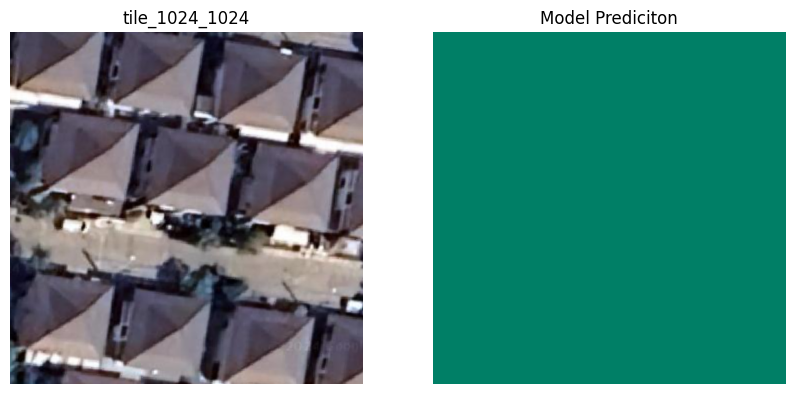

tiles left 47 ...


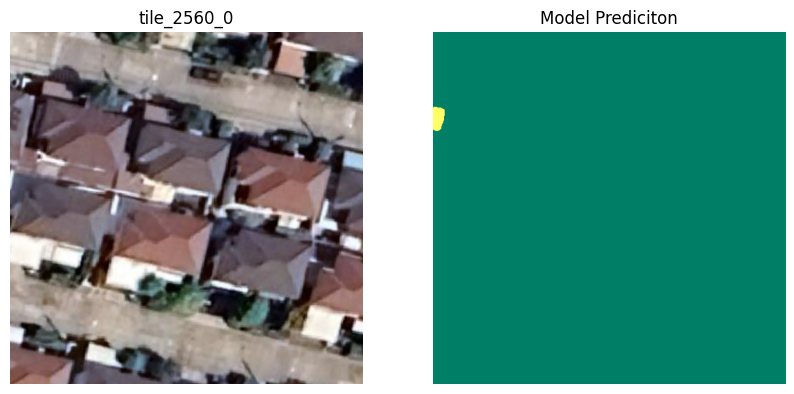

tiles left 46 ...


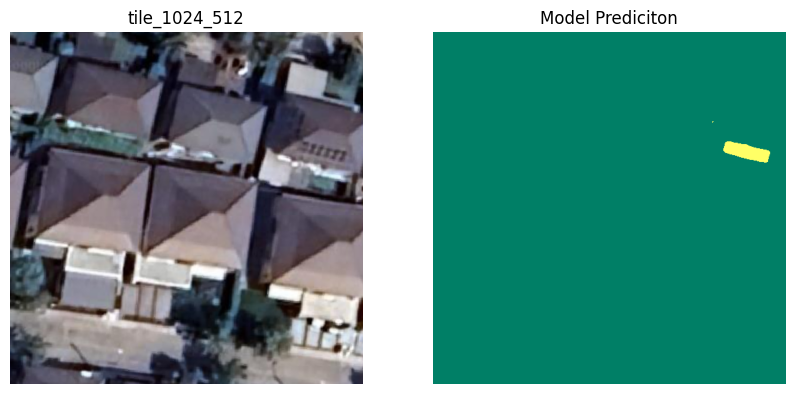

tiles left 45 ...


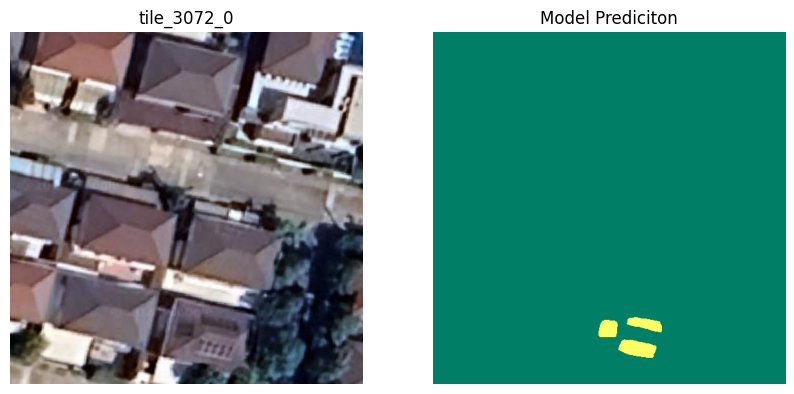

tiles left 44 ...


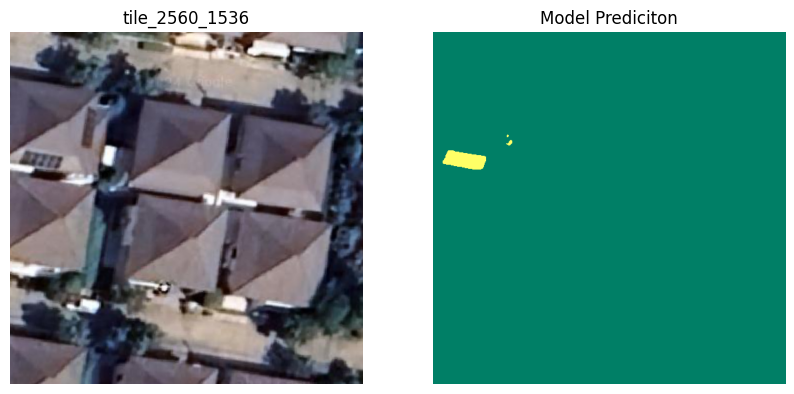

tiles left 43 ...


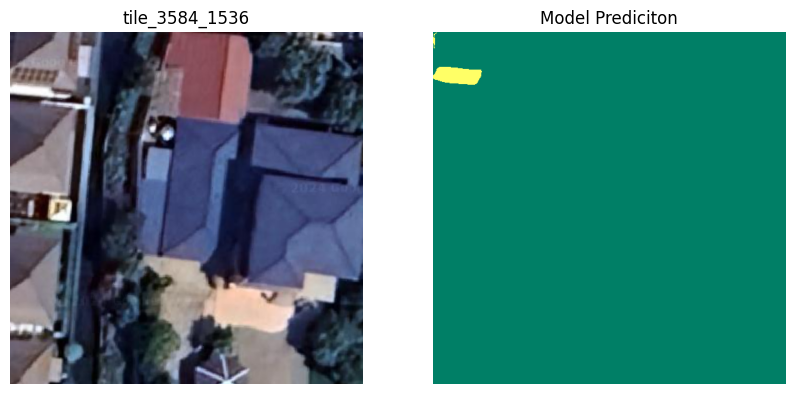

tiles left 42 ...


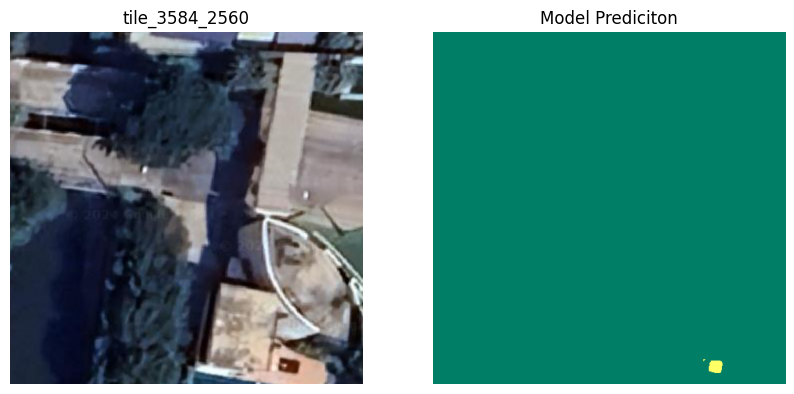

tiles left 41 ...


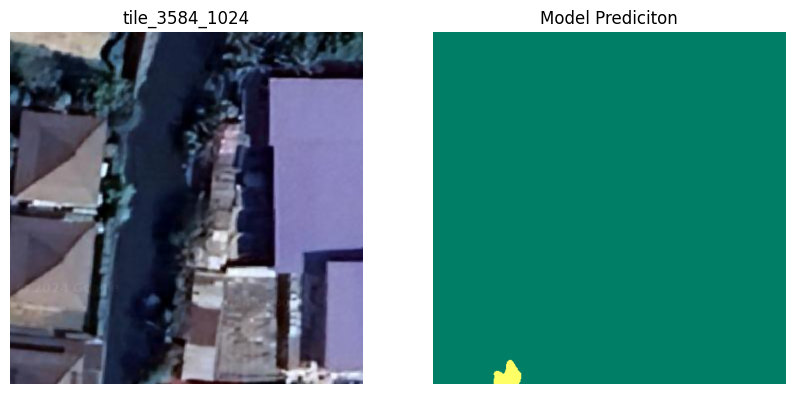

tiles left 40 ...


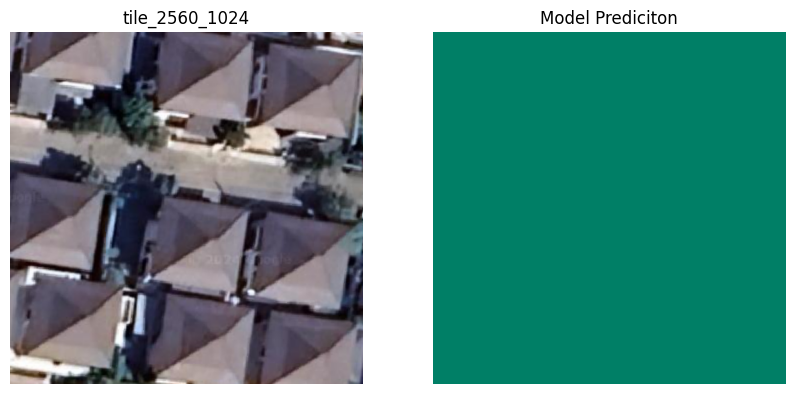

tiles left 39 ...


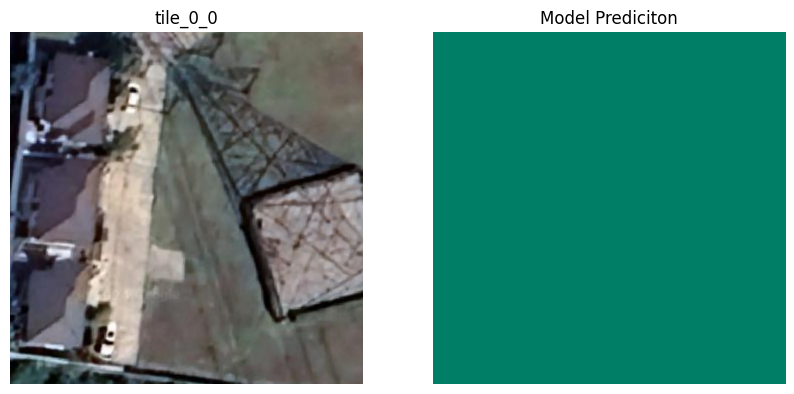

tiles left 38 ...


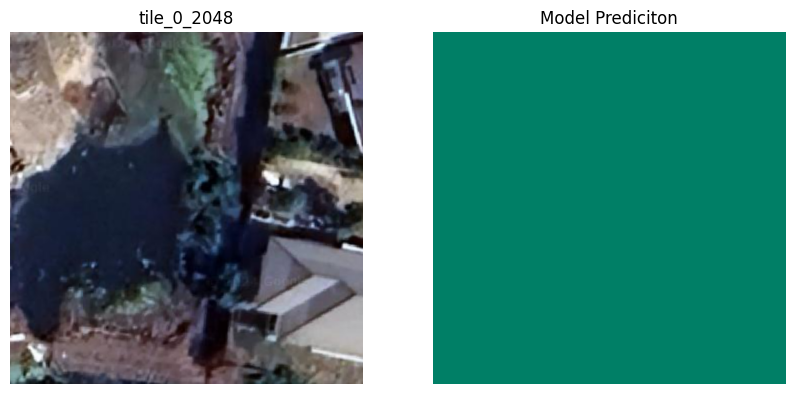

tiles left 37 ...


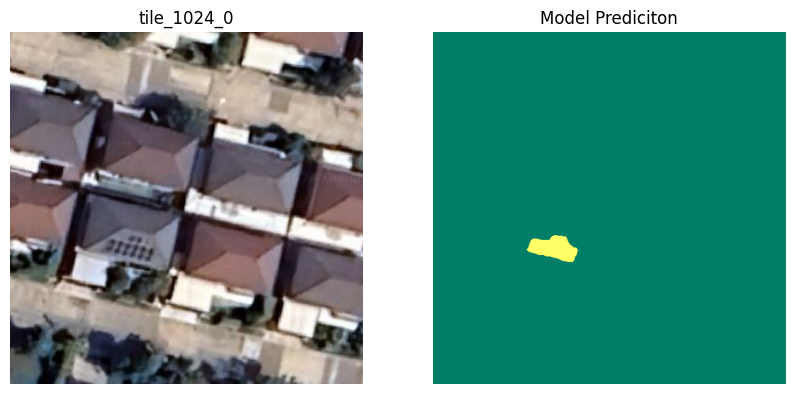

tiles left 36 ...


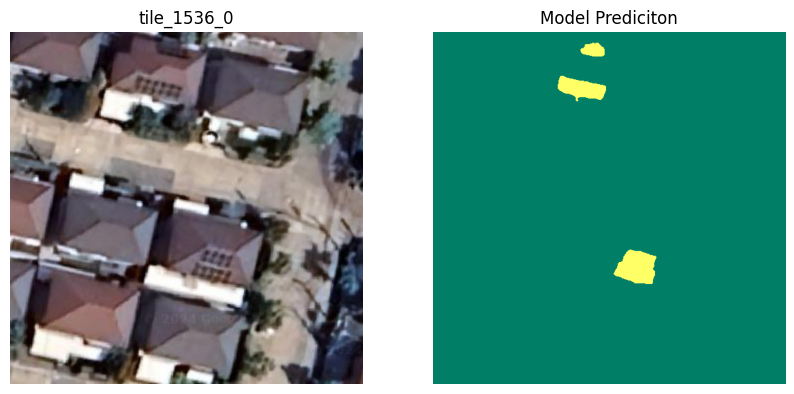

tiles left 35 ...


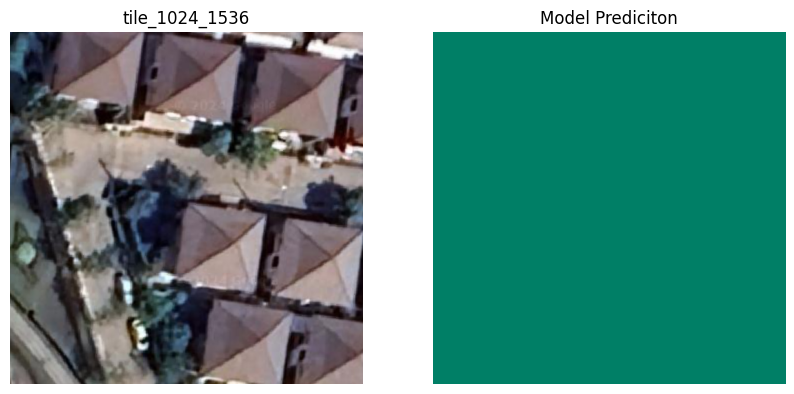

tiles left 34 ...


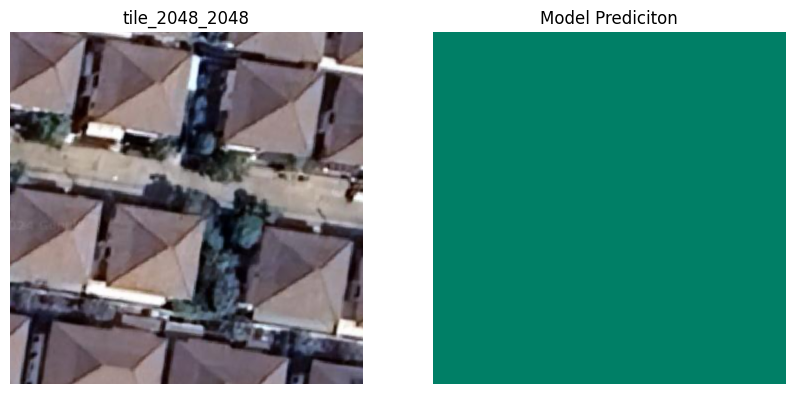

tiles left 33 ...


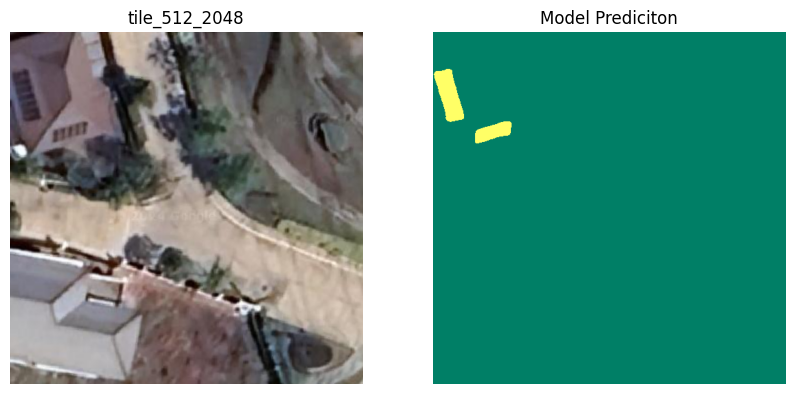

tiles left 32 ...


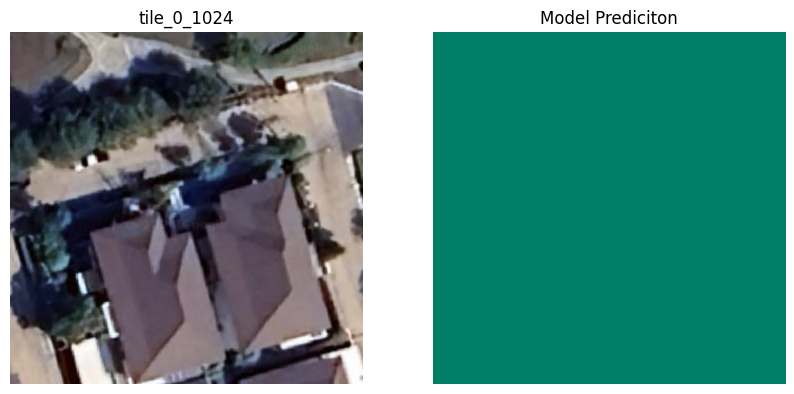

tiles left 31 ...


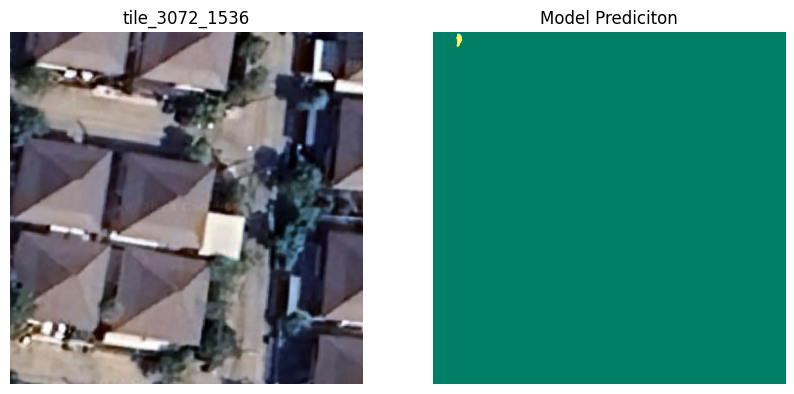

tiles left 30 ...


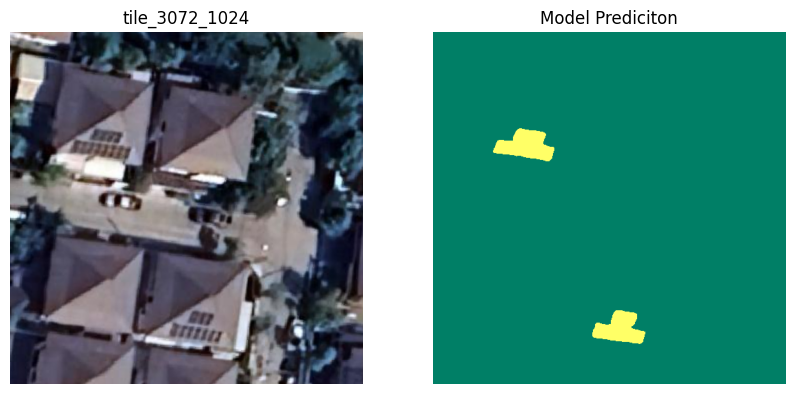

tiles left 29 ...


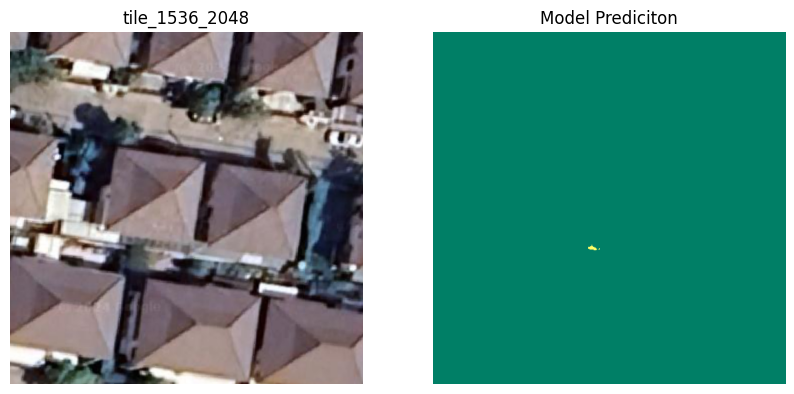

tiles left 28 ...


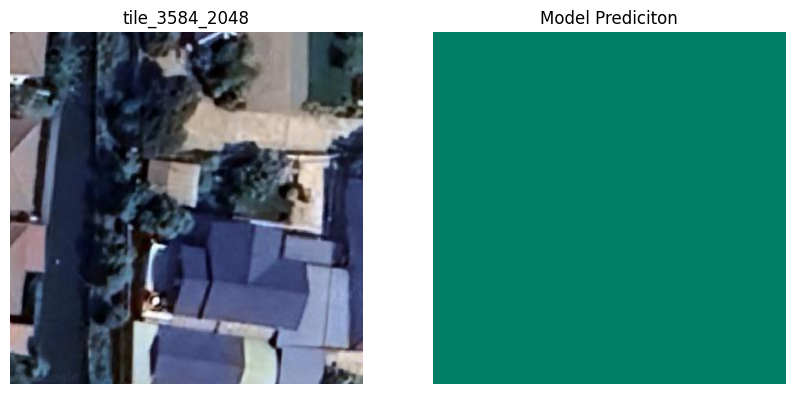

tiles left 27 ...


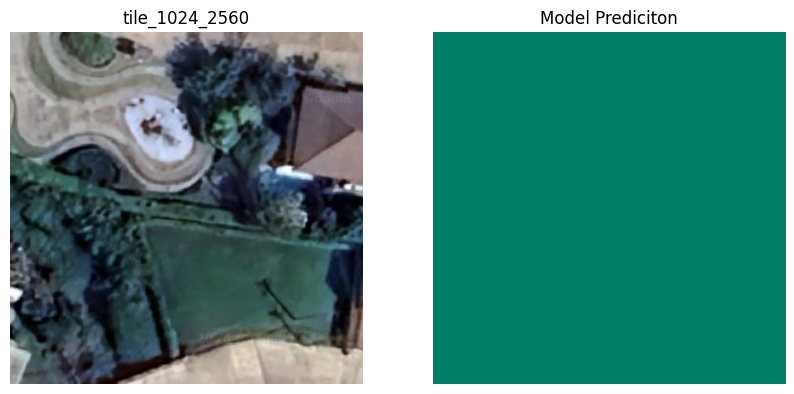

tiles left 26 ...


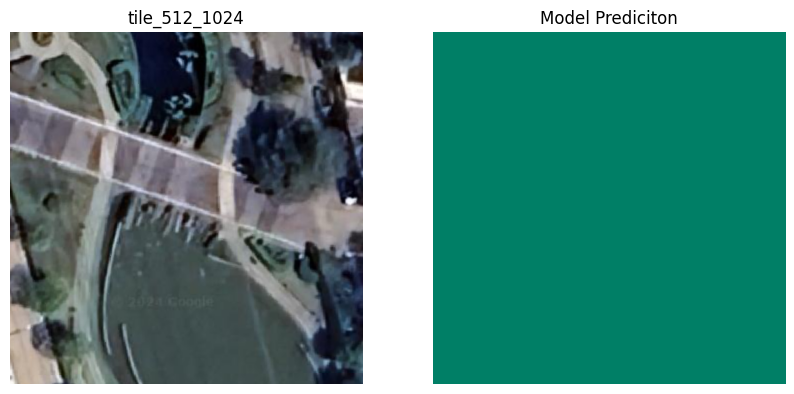

tiles left 25 ...


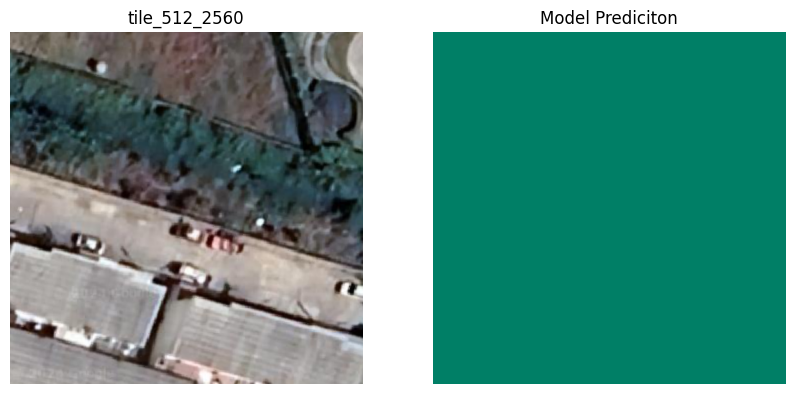

tiles left 24 ...


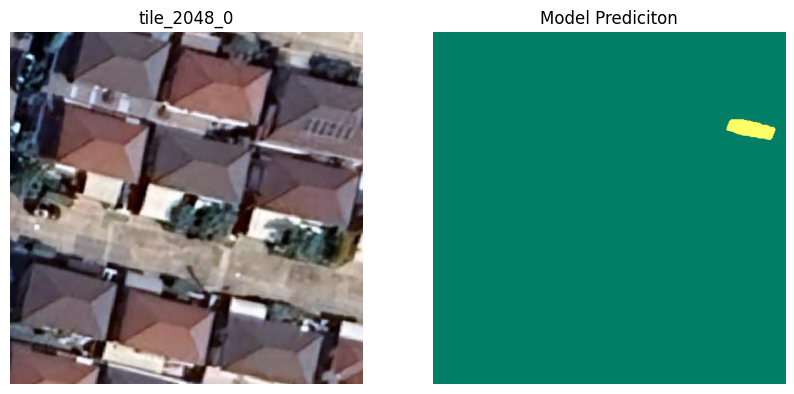

tiles left 23 ...


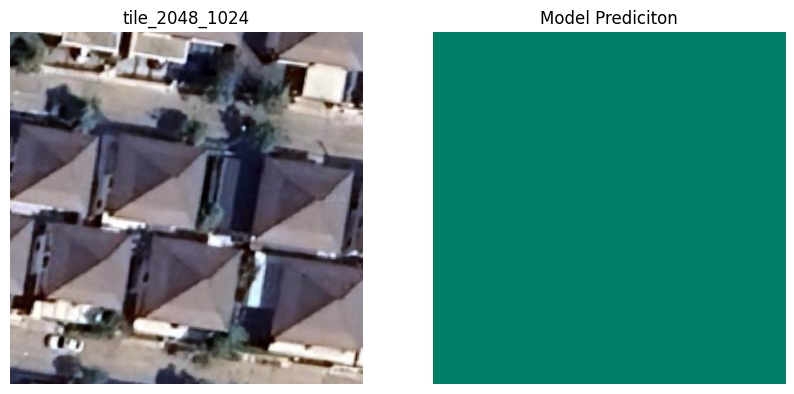

tiles left 22 ...


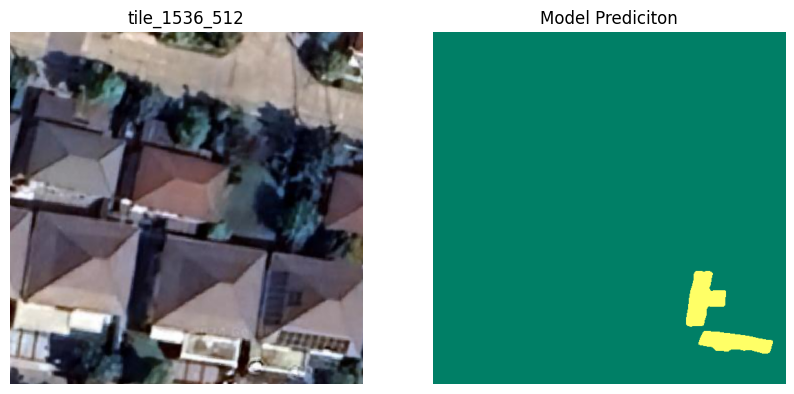

tiles left 21 ...


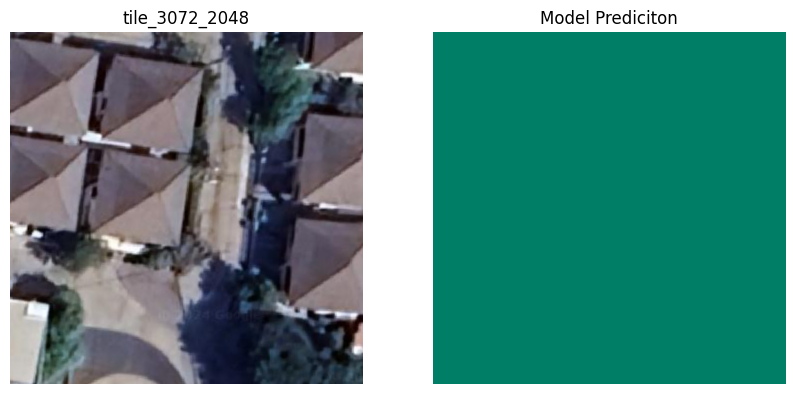

tiles left 20 ...


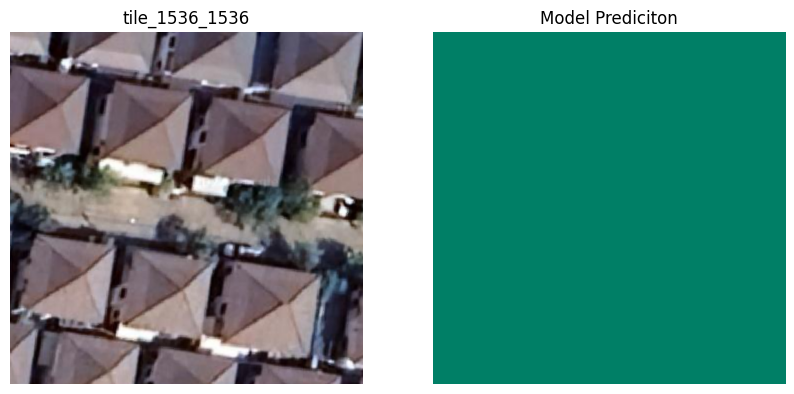

tiles left 19 ...


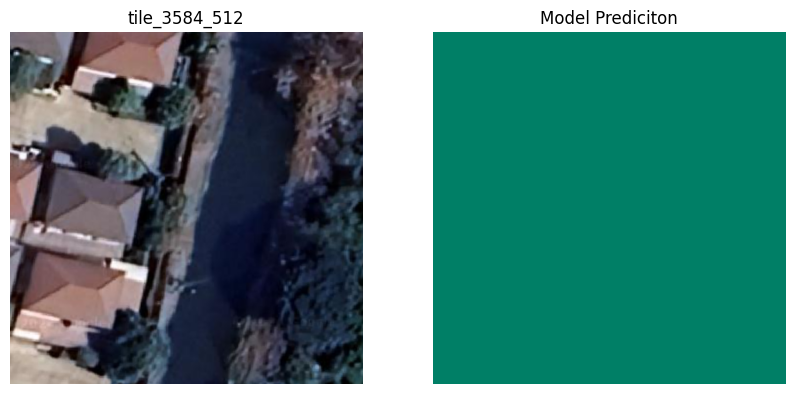

tiles left 18 ...


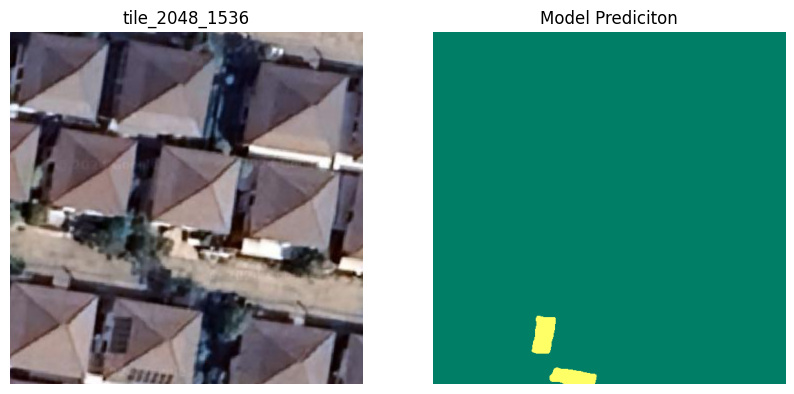

tiles left 17 ...


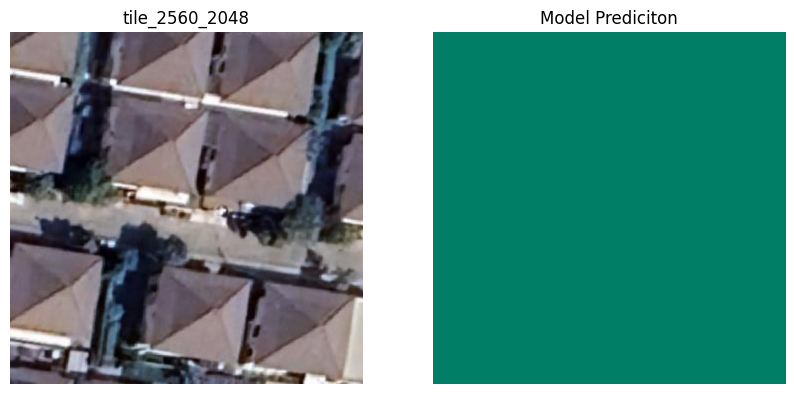

tiles left 16 ...


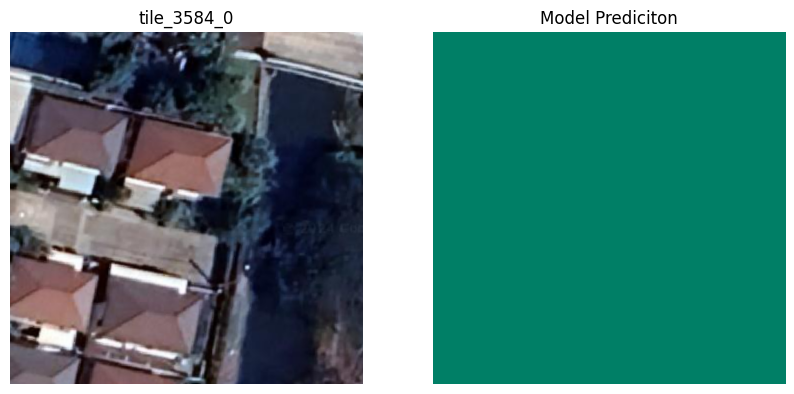

tiles left 15 ...


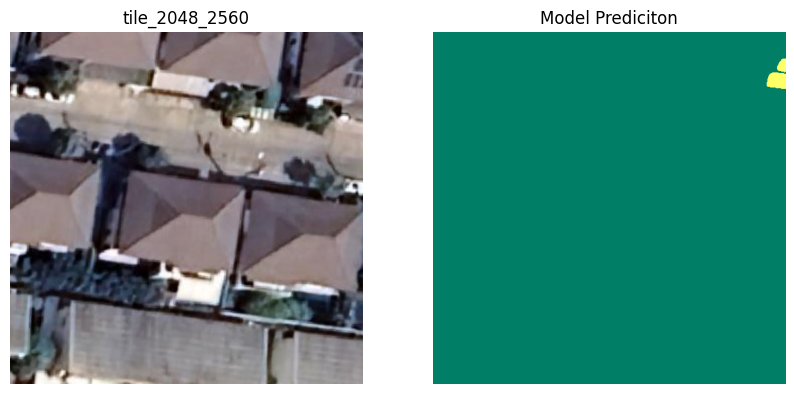

tiles left 14 ...


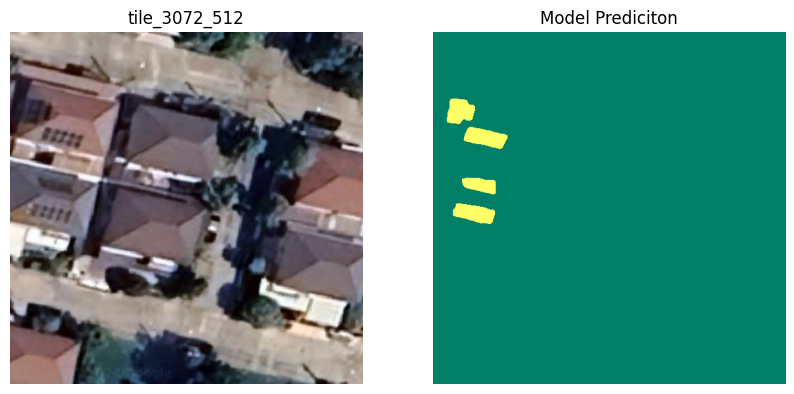

tiles left 13 ...


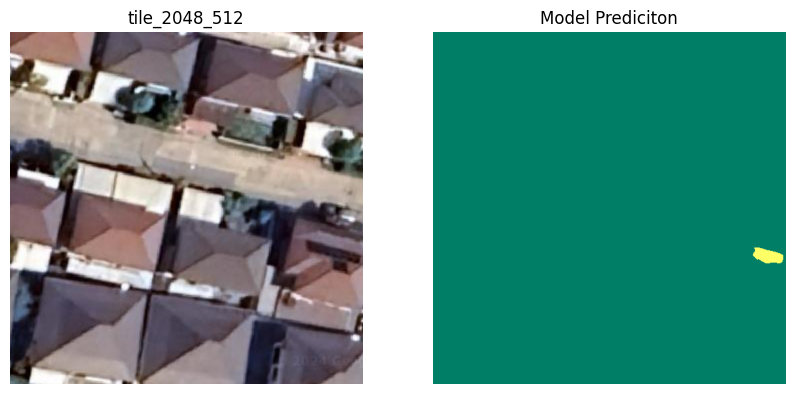

tiles left 12 ...


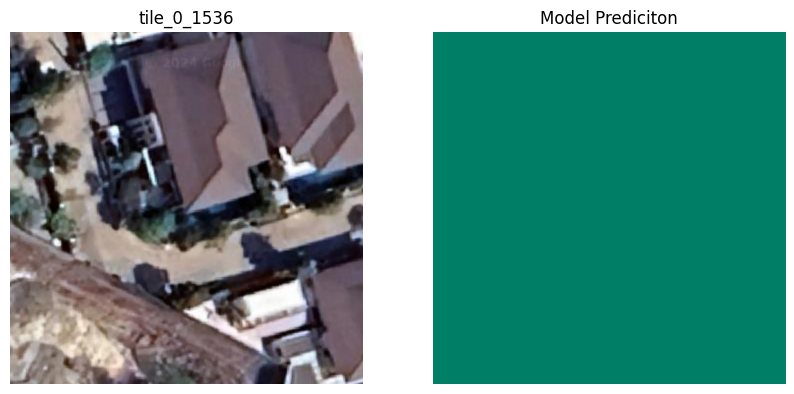

tiles left 11 ...


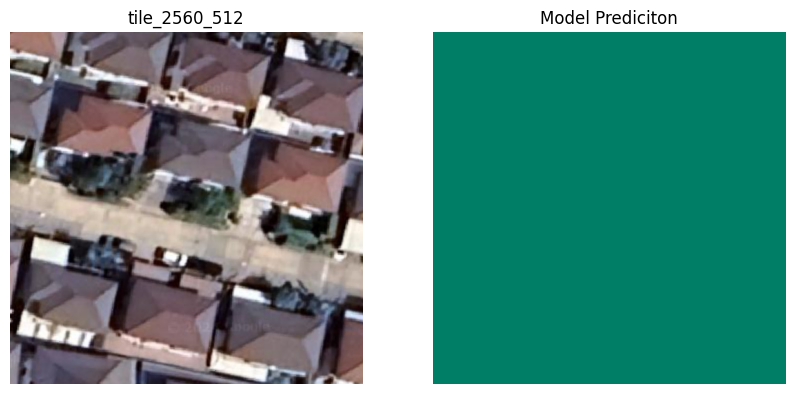

tiles left 10 ...


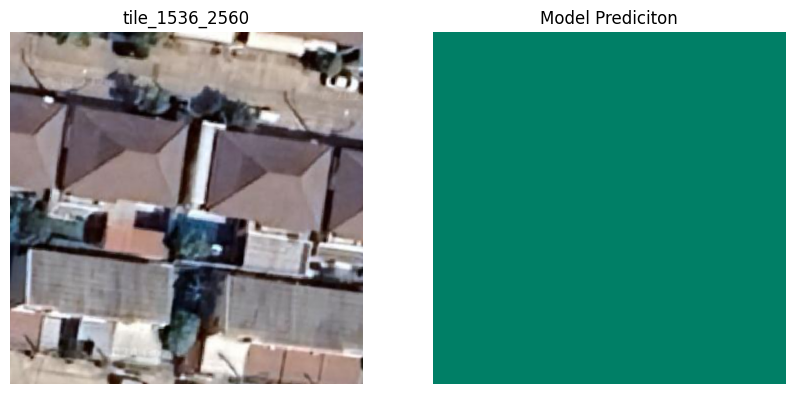

tiles left 9 ...


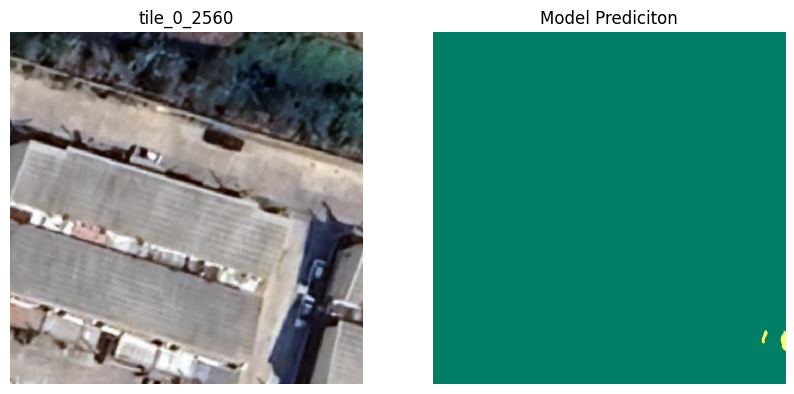

tiles left 8 ...


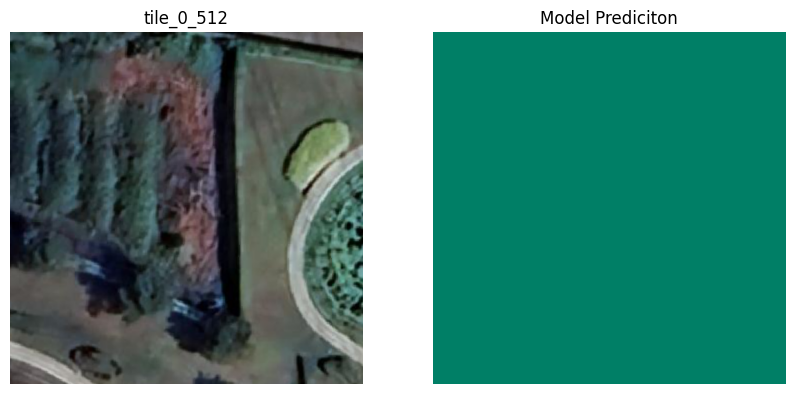

tiles left 7 ...


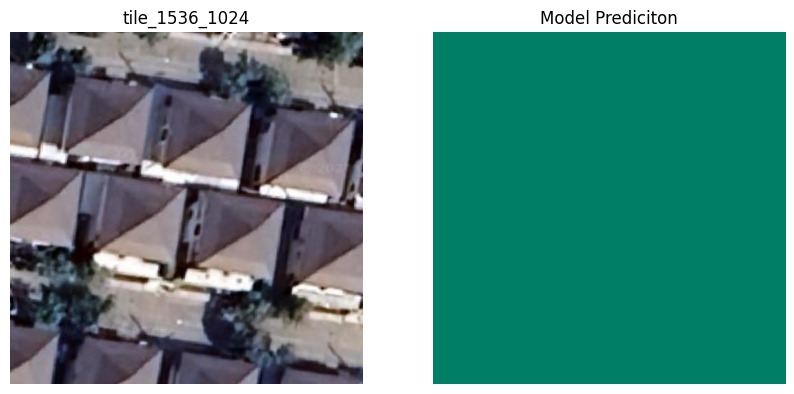

tiles left 6 ...


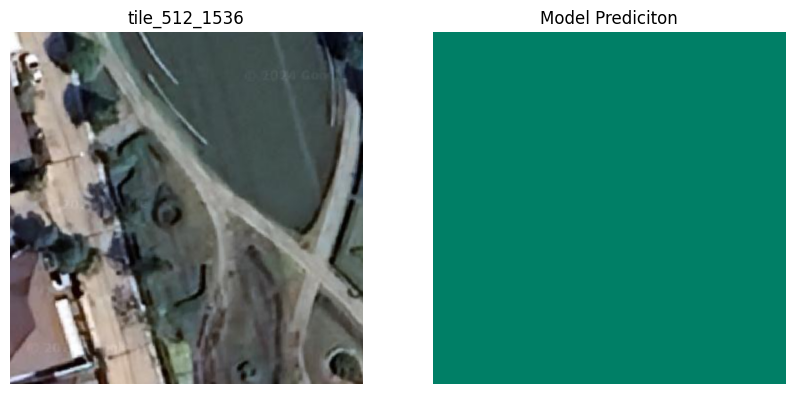

tiles left 5 ...


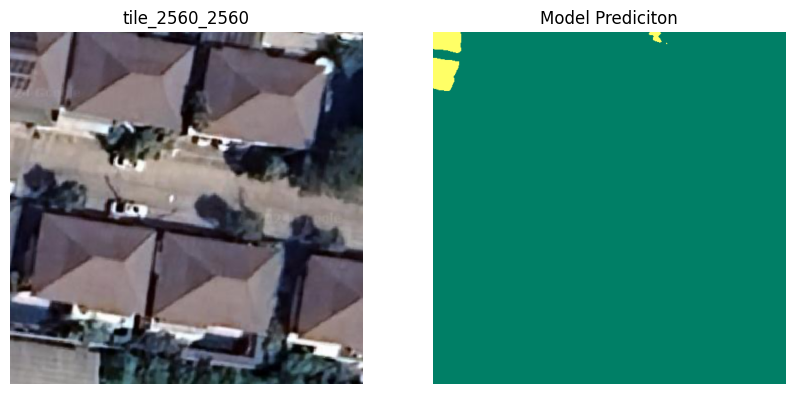

tiles left 4 ...


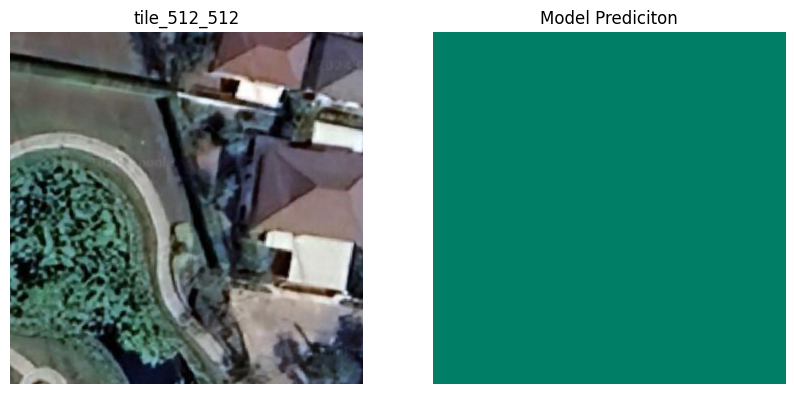

tiles left 3 ...


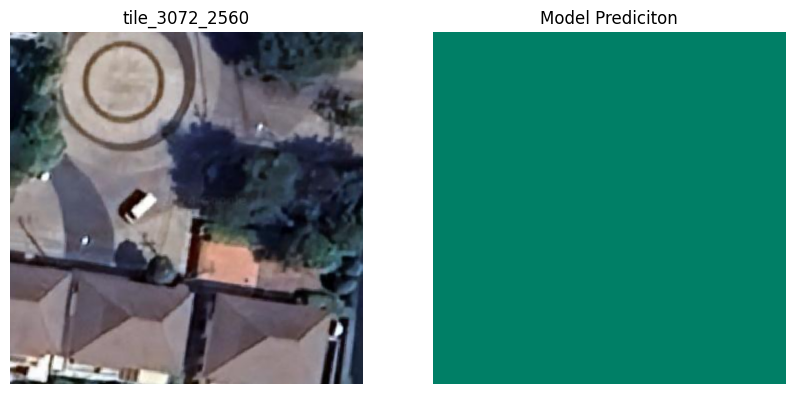

tiles left 2 ...


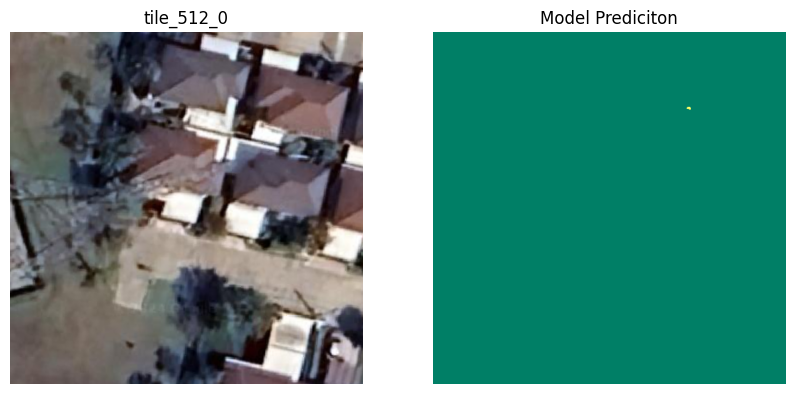

tiles left 1 ...


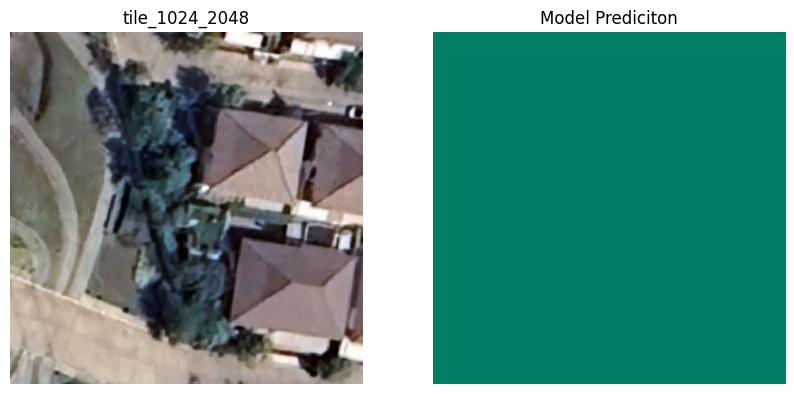

tiles left 0 ...


In [16]:
new_size = (512, 512)
threshold = 0.9
img_list = os.listdir(dir_tiles)
tiles_left = len(img_list)
img_list.sort()

for tile in os.listdir(dir_tiles):
  img_path = os.path.join(dir_tiles, tile)

  src_ds = gdal.Open(img_path)

  image = plt.imread(img_path)
  image = image[:,:,:3]
  image = image.astype(int)
  #image = tf.image.resize(image, new_size)
  processed_test_img = backbone_preprocess(image)

  mask_4d = model(np.expand_dims(processed_test_img, axis=(0)))
  pred_mask_prob = np.squeeze(mask_4d, axis=0)
  pred_mask = np.where(pred_mask_prob > threshold, 1, 0)

  tile = tile.split('.')
  mask_path = os.path.join(dir_masks,tile[0]+'_mask.'+tile[1])
  cv2.imwrite(mask_path, pred_mask)

  target_ds = gdal.Open(mask_path, gdal.GA_Update)
  target_ds.SetGeoTransform(src_ds.GetGeoTransform())
  target_ds.SetProjection(src_ds.GetProjection())
  src_ds = None
  target_ds = None

  show_images((image, pred_mask), [tile[0], "Model Prediciton"])
  tiles_left -= 1
  print("tiles left",tiles_left,"...")


# Merge mask tiles into one

In [17]:
import os
from osgeo import gdal

def merge_tiles(input_dir, output_file):
    # Get list of tile files
    tile_files = [os.path.join(input_dir, f) for f in os.listdir(input_dir) if f.endswith('.tif')]

    # Build VRT from tile files
    vrt_options = gdal.BuildVRTOptions(resampleAlg='nearest')
    vrt = gdal.BuildVRT(os.path.join(output_file + '.vrt'), tile_files, options=vrt_options)

    try:
        # Translate VRT to final output file
        gdal.Translate(output_file, vrt)

    except ValueError as e:
        print("Error during translation:", e)
        print("Applying transparency to problematic sections.")

        # Get NoData value
        no_data_value = vrt.GetRasterBand(1).GetNoDataValue()

        # Set transparent pixels
        gdal.Translate(output_file, vrt, format='GTiff', creationOptions=['ALPHA=YES'], noData=no_data_value)

    finally:
        # Close datasets
        vrt = None



In [18]:
name, _ = file_name.split('.')
merged_mask_path = name+"_merged_mask.tif"
merge_tiles(dir_masks, merged_mask_path)

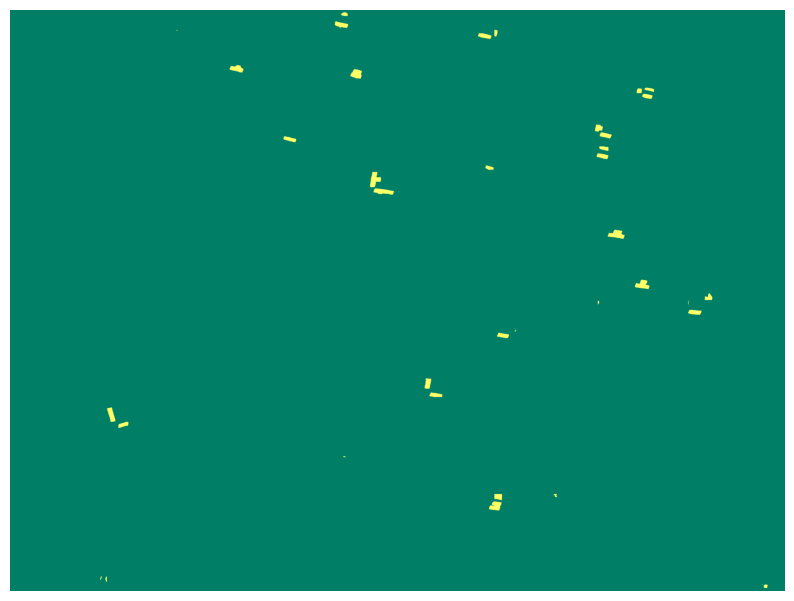

In [19]:
image = Image.open(merged_mask_path)

# Convert the image to grayscale
gray_image = image.convert('L')

show_1image(gray_image)

# Extract LatLongBound
This step is used to extract the values used for overlaying the image on Google Map Javascript API

In [20]:
from osgeo import gdal, osr
from typing import Tuple

def get_geotiff_bounds(file_path: str) -> Tuple[float, float, float, float]:
    """
    Get the bounding box (in WGS84 coordinates) of a GeoTIFF file.

    Args:
        file_path (str): Path to the GeoTIFF file.

    Returns:
        Tuple[float, float, float, float]: Bounding box coordinates in the order (min_lng, min_lat, max_lng, max_lat).
    """
    # Open the GeoTIFF file
    dataset = gdal.Open(file_path)

    # Reproject to WGS84
    target_srs = osr.SpatialReference()
    target_srs.ImportFromEPSG(4326)  # WGS84 EPSG code
    options = gdal.WarpOptions(dstSRS=target_srs)
    gdal.Warp("/vsimem/temp.tif", dataset, options=options)

    # Open the reprojected file
    reprojected_dataset = gdal.Open("/vsimem/temp.tif")

    # Get geotransform information
    geotransform = reprojected_dataset.GetGeoTransform()

    # Get raster dimensions
    width = reprojected_dataset.RasterXSize
    height = reprojected_dataset.RasterYSize

    # Calculate bounding box coordinates
    min_lng = geotransform[0]
    max_lng = geotransform[0] + width * geotransform[1] + height * geotransform[2]
    max_lat = geotransform[3]
    min_lat = geotransform[3] + width * geotransform[4] + height * geotransform[5]

    # Close the reprojected dataset and delete the temporary file
    reprojected_dataset = None
    gdal.Unlink("/vsimem/temp.tif")

    return min_lng, min_lat, max_lng, max_lat


In [21]:
bounds = get_geotiff_bounds(file_path)
print("Bounding box coordinates (min_lng, min_lat, max_lng, max_lat):", bounds)

Bounding box coordinates (min_lng, min_lat, max_lng, max_lat): (100.69508802066113, 13.683929734426174, 100.69889407145091, 13.686731780008818)


# Raster to Polygon shapefile

In [22]:
!pip install -q rasterio

In [23]:
import rasterio
from rasterio.features import shapes
from shapely.geometry import shape, mapping
from shapely.ops import transform
import fiona
import zipfile
import pyproj

def mask_to_shapefile(mask_path, shapefile_path, mask_value=1):
    """
    Converts a GeoTIFF mask raster to a Shapefile, highlighting areas with a specific mask value.

    Args:
        mask_path (str): Path to the GeoTIFF mask raster.
        shapefile_path (str): Path to save the generated Shapefile.
        mask_value (int, optional): Value in the mask raster representing the areas to highlight. Defaults to 1.
    """

    with rasterio.open(mask_path) as src:
        image = src.read(1)  # Read the first band (assuming single-band mask)
        transform_affine = src.transform
        crs = src.crs

        # Transformer to convert coordinates to EPSG:4326
        transformer = pyproj.Transformer.from_crs(crs, pyproj.CRS("EPSG:4326"), always_xy=True).transform

        # Extract shapes from mask
        results = (
            {'properties': {'raster_val': v}, 'geometry': s}
            for i, (s, v) in enumerate(shapes(image, transform=transform_affine))
            if v == mask_value
        )

        # Define the schema for the shapefile
        schema = {
            'geometry': 'Polygon',
            'properties': {'raster_val': 'int'}
        }

        # Write the shapefile in EPSG:4326
        with fiona.open(shapefile_path, 'w', driver='ESRI Shapefile', crs=fiona.crs.CRS.from_epsg(4326), schema=schema) as dst:
            for result in results:
                geom = shape(result['geometry'])

                # Project coordinates to EPSG:4326
                geom = transform(transformer, geom)

                dst.write({
                    'geometry': mapping(geom),
                    'properties': result['properties']
                })

def zip_shapefile(shapefile_path, zip_path):
    """
    Compresses a shapefile and its associated files into a .zip file.

    Args:
        shapefile_path (str): Path to the generated Shapefile (without extension).
        zip_path (str): Path to save the .zip file.
    """
    # List of associated shapefile extensions
    extensions = ['.shp', '.shx', '.dbf', '.prj', '.cpg']

    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for ext in extensions:
            filepath = shapefile_path + ext
            if os.path.exists(filepath):
                zipf.write(filepath, os.path.basename(filepath))



Create Shapefile folder

In [24]:
shapefile_folder_path = '/content/shapefile'

In [25]:
try:
  os.mkdir(shapefile_folder_path)
except:
  pass

Delete contents of the Shapefile folder to have a fresh start

In [26]:
del_path = shapefile_folder_path
try:
  del_dir_contents(del_path)
except:
  pass

Convert Raster to Polygons

In [27]:
raster_path = merged_mask_path
shapefile_path = os.path.join(shapefile_folder_path , name+'_polygon_mask.shp')
shapefile_name_path , _ = shapefile_path.split('.')
zip_path = name+'_polygon_mask.zip'

mask_to_shapefile(raster_path, shapefile_path, mask_value=1)
zip_shapefile(shapefile_name_path, zip_path)

# Simplify Shapefile and calculate area, power generation estimate, and panel per solar array estimate

In [28]:
import geopandas as gpd
from shapely.geometry import Point, Polygon
import pandas as pd

def calculate_polygon_areas_and_export(shp_file, output_shp_file, tolerance=0.25, min_area=1.0):
    # Read shapefile
    gdf = gpd.read_file(shp_file)

    # Ensure it's a GeoDataFrame with polygons
    if 'geometry' not in gdf.columns or gdf.geom_type[0] != 'Polygon':
        raise ValueError("Input file does not contain polygon geometries.")

    # Simplify polygons using the Douglas-Peucker algorithm
    gdf = gdf.to_crs(epsg=24047)
    gdf['geometry'] = gdf['geometry'].simplify(tolerance, preserve_topology=True)

    # Calculate areas
    polygons = gdf[gdf.geometry.type == 'Polygon']

    # Change name of polygons to their size
    gdf['area'] = polygons.geometry.area

    gdf_min_area = gdf[gdf['area'] >= min_area]

    total_area = gdf_min_area['area'].sum().round(2)

    # Average amount of panels in an array(polygon)
    gdf_min_area['PanelAmt'] = np.floor(gdf_min_area['area'] / 2.21).astype(int)

    # Power Generation estimate calculations
    watt_per_m2 = 250
    hours_per_day = 5
    effeciency = 0.15 # Average 15-20%
    watt = gdf_min_area['area'] * watt_per_m2
    kWh_daily_output = watt/1000 * hours_per_day * effeciency
    gdf_min_area['PowerGen'] = kWh_daily_output

    gdf_min_area = gdf_min_area.to_crs(epsg=4326)

    print(gdf_min_area)
    print(total_area)

    # Export to shapefile
    gdf_min_area.to_file(output_shp_file)

    print("Shapefile exported successfully.")

Create Simplified Shapefile folder

In [29]:
simplified_shapefile_folder_path = '/content/simplified_shapefile'

In [30]:
try:
  os.mkdir(simplified_shapefile_folder_path)
except:
  pass

Delete contents of the Simplified Shapefile folder to have a fresh start

In [31]:
del_path = simplified_shapefile_folder_path
try:
  del_dir_contents(del_path)
except:
  pass

Simplify Shapefile and calculate area, power generation estimate, and panel per solar array estimate

In [32]:
output_shapefile = '/content/shapefile_simplified/output.shp'
output_shapefile = os.path.join(simplified_shapefile_folder_path,name+'simplified_polygon_mask.shp')
zipped_shapefile = name+'simplified_polygon_mask.zip'
shapefile_simplified_name_path, _ = output_shapefile.split('.')

calculate_polygon_areas_and_export(shapefile_path, output_shapefile)
zip_shapefile(shapefile_simplified_name_path, zipped_shapefile)

    raster_val                                           geometry       area  \
0            1  POLYGON ((100.69674 13.68671, 100.69675 13.686...   5.469975   
1            1  POLYGON ((100.69670 13.68666, 100.69676 13.686...  15.479930   
3            1  POLYGON ((100.69747 13.68662, 100.69749 13.686...   4.554979   
4            1  POLYGON ((100.69740 13.68660, 100.69743 13.686...  13.869937   
5            1  POLYGON ((100.69622 13.68646, 100.69623 13.686...  18.119918   
6            1  POLYGON ((100.69679 13.68643, 100.69683 13.686...  21.909901   
7            1  POLYGON ((100.69821 13.68634, 100.69825 13.686...   6.319971   
8            1  POLYGON ((100.69817 13.68633, 100.69819 13.686...   5.484975   
9            1  POLYGON ((100.69820 13.68631, 100.69824 13.686...   9.519957   
11           1  POLYGON ((100.69797 13.68616, 100.69799 13.686...  10.789951   
12           1  POLYGON ((100.69799 13.68612, 100.69804 13.686...  12.949942   
13           1  POLYGON ((100.69644 13.6

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
